In [6]:
import pandas as pd
import numpy as np

import geopandas as gpd
from shapely import wkt

# read movebis speed data

In [7]:
# get overview
data_speed_test=pd.read_csv(r"C:\Users\Simon\Downloads\movebis\geschwindigkeiten_2020.csv.tar", nrows=5)
data_speed_test

,geschwindigkeiten_2020.csv,avg_speed_kmh,visits
0,"LINESTRING(13.7600056 48.8077468,13.7602024 48...",20.880000,1
1,"LINESTRING(13.7611894 48.80818,13.7613457 48.8...",21.396000,1
2,"LINESTRING(13.7610531 48.8080973,13.7611894 48...",22.716000,1
3,"LINESTRING(13.7602024 48.807818,13.7606905 48....",20.360571,1
4,"LINESTRING(13.7606905 48.8079335,13.7608807 48...",19.512000,1


In [8]:
data_speed=pd.read_csv(r"C:\Users\Simon\Downloads\movebis\geschwindigkeiten_2020.csv.tar")
data_speed

,geschwindigkeiten_2020.csv,avg_speed_kmh,visits
0,"LINESTRING(13.7600056 48.8077468,13.7602024 48...",20.880000,1.0
1,"LINESTRING(13.7611894 48.80818,13.7613457 48.8...",21.396000,1.0
2,"LINESTRING(13.7610531 48.8080973,13.7611894 48...",22.716000,1.0
3,"LINESTRING(13.7602024 48.807818,13.7606905 48....",20.360571,1.0
4,"LINESTRING(13.7606905 48.8079335,13.7608807 48...",19.512000,1.0
...,...,...,...
35632537,"LINESTRING(8.387752 55.0356764,8.3873955000000...",19.825207,9.0
35632538,"LINESTRING(8.38797029999999 55.0357006,8.38814...",24.886763,3.0
35632539,"LINESTRING(8.3881487 55.0357333,8.387970299999...",19.627612,9.0
35632540,"LINESTRING(8.38797029999999 55.0357006,8.38775...",19.802735,9.0


In [9]:
data_speed=data_speed.rename(columns={"geschwindigkeiten_2020.csv": "geometry"})

In [10]:
#keep only links with more than 100 visits, so avg. speed meight be reliable
data_speed=data_speed[data_speed.visits>100].copy()
len(data_speed)

659209

In [11]:
data_speed['geometry'] = data_speed['geometry'].apply(wkt.loads)

In [12]:
gdf_speed = gpd.GeoDataFrame(data_speed, geometry='geometry', crs='EPSG:4326')

In [13]:
gdf_speed=gdf_speed.to_crs('EPSG:3857')#"EPSG:25833")

<AxesSubplot:>

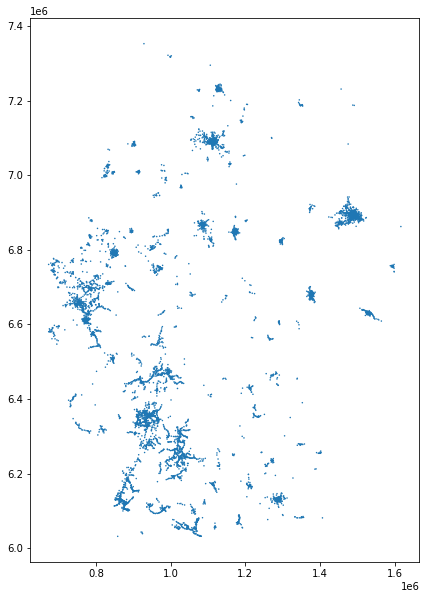

In [14]:
#plot every 100 link to get overview
gdf_speed[::100].buffer(2000).plot(figsize=(10,10))

# plot

In [15]:
import contextily as ctx

Text(670569.3087255941, 5879113.208040713, 'Quelle: Movebis, https://www.mcloud.de/web/guest/suche/-/results/suche/relevance/movebis/0/detail/33427A5A-0ADB-40B1-8A1A-390B67B0380B')

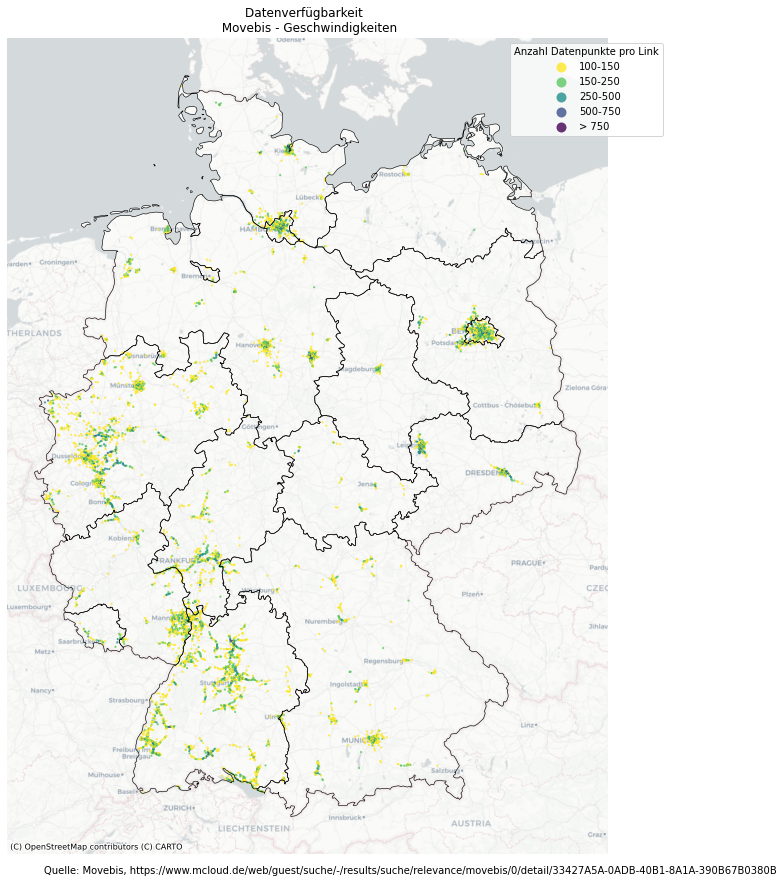

In [18]:



df_plot=gdf_speed[::100].copy()

df_plot.geometry=df_plot.buffer(2000)

#df_plot=df_plot.to_crs('EPSG:3857')


label_list=['100-150',
'150-250',
'250-500',
'500-750',
'> 750']


ax=df_plot.plot(column='visits', scheme='UserDefined', figsize=(15,15), legend=True, alpha=0.8, cmap='viridis_r',# linewidths=1,
            classification_kwds={
             #'k':5
             'bins':[150,250,500,750]
         },
            legend_kwds = { 
                #'numpoints':1,
                'bbox_to_anchor':(1.1, 1),
                'title': "Anzahl Datenpunkte pro Link",#"KBA-Kategorien Elektrofzg. pro 5x5km",
                'labels':label_list }
            )
#adding bundslandgrenzen layer
fin_plot=bland.plot(facecolor="none", edgecolor='black', linewidths=0.6, figsize=(15,15), ax=ax)#, weight=1)

#adding basemap
ctx.add_basemap(fin_plot, source=ctx.providers.CartoDB.Positron)

#remove axis
fin_plot.set_axis_off()

#add title
fin_plot.set_title('Datenverfügbarkeit  \n Movebis - Geschwindigkeiten')

#Quelle
fin_plot.text(df_plot.total_bounds[0], df_plot.total_bounds[1]*0.975, "Quelle: Movebis, https://www.mcloud.de/web/guest/suche/-/results/suche/relevance/movebis/0/detail/33427A5A-0ADB-40B1-8A1A-390B67B0380B")
#fin_plot.annotate("Test", xy=(0.5, 0.5))


# Bundesland

<AxesSubplot:>

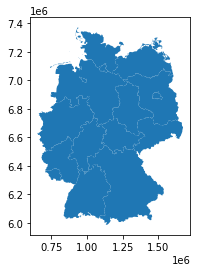

In [17]:
import requests, zipfile, io

# downlaod and unzip Nuts Shape
zip_file_url="https://daten.gdz.bkg.bund.de/produkte/vg/nuts2500/aktuell/nuts2500_01-01.utm32s.shape.zip"
r = requests.get(zip_file_url)
z = zipfile.ZipFile(io.BytesIO(r.content))
z.extractall()

# load Nuts Shape
bland=gpd.read_file(r"nuts2500_01-01.utm32s.shape\nuts2500\2500_NUTS1.shp")
bland = bland.to_crs("EPSG:3857")
bland.plot()

<AxesSubplot:>

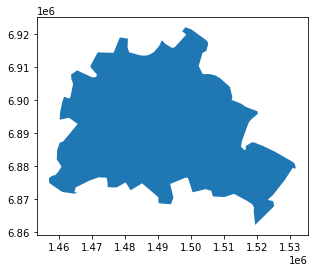

In [19]:
berlin=bland[bland.NUTS_NAME=='Berlin']
berlin.plot()

# clip Berlin-data

In [20]:
gdf_berlin_speed = gpd.clip(gdf_speed, berlin)

<AxesSubplot:>

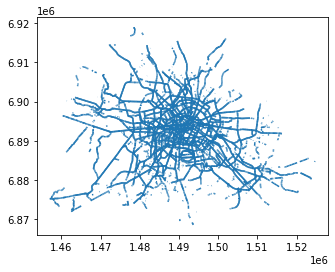

In [21]:
gdf_berlin_speed.plot()

Text(1456988.055584678, 6854749.612579959, 'Quelle: Movebis, https://www.mcloud.de/web/guest/suche/-/results/suche/relevance/movebis/0/detail/33427A5A-0ADB-40B1-8A1A-390B67B0380B')

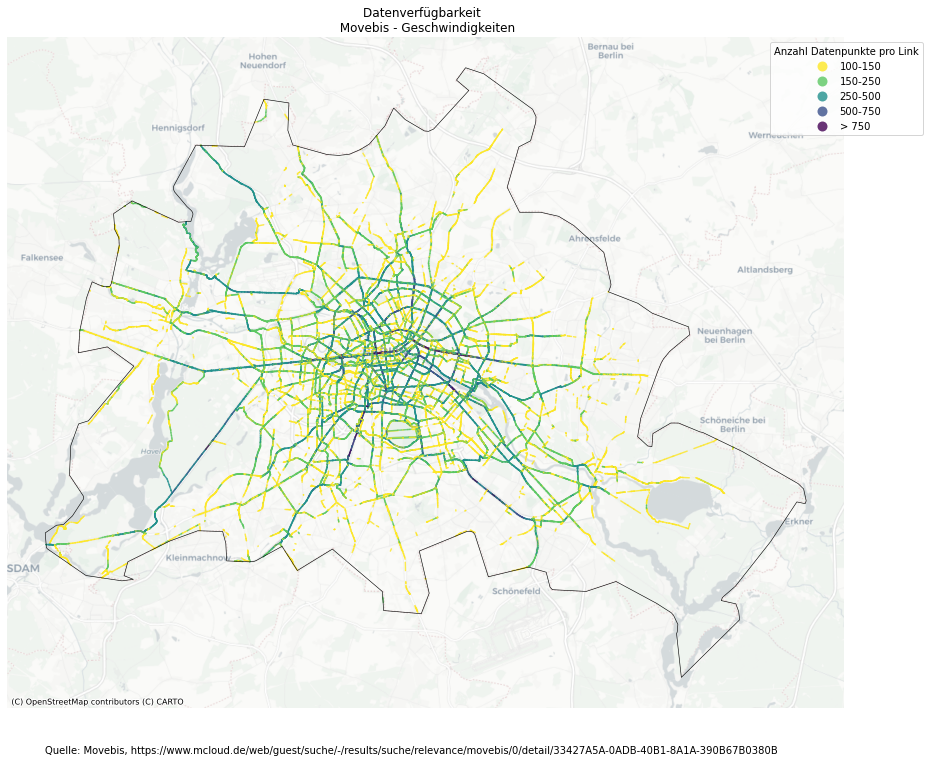

In [22]:

df_plot=gdf_berlin_speed.copy()

df_plot.geometry=df_plot.buffer(70)

#df_plot=df_plot.to_crs('EPSG:3857')


label_list=['100-150',
'150-250',
'250-500',
'500-750',
'> 750']


ax=df_plot.plot(column='visits', scheme='UserDefined', figsize=(15,15), legend=True, alpha=0.8, cmap='viridis_r',# linewidths=1,
            classification_kwds={
             #'k':5
             'bins':[150,250,500,750]
         },
            legend_kwds = { 
                #'numpoints':1,
                'bbox_to_anchor':(1.1, 1),
                'title': "Anzahl Datenpunkte pro Link",#"KBA-Kategorien Elektrofzg. pro 5x5km",
                'labels':label_list }
            )
#adding bundslandgrenzen layer
fin_plot=berlin.plot(facecolor="none", edgecolor='black', linewidths=0.6, figsize=(15,15), ax=ax)#, weight=1)

#adding basemap
ctx.add_basemap(fin_plot, source=ctx.providers.CartoDB.Positron)

#remove axis
fin_plot.set_axis_off()

#add title
fin_plot.set_title('Datenverfügbarkeit  \n Movebis - Geschwindigkeiten')

#Quelle
fin_plot.text(df_plot.total_bounds[0], df_plot.total_bounds[1]*0.998, "Quelle: Movebis, https://www.mcloud.de/web/guest/suche/-/results/suche/relevance/movebis/0/detail/33427A5A-0ADB-40B1-8A1A-390B67B0380B")
#fin_plot.annotate("Test", xy=(0.5, 0.5))


In [23]:
gdf_berlin_speed

,geometry,avg_speed_kmh,visits
31078578,"LINESTRING (1510312.419 6897612.419, 1510420.3...",22.319153,153.0
31078590,"LINESTRING (1510430.841 6897968.330, 1510281.3...",23.909370,144.0
31079366,"LINESTRING (1510636.448 6898733.920, 1510685.6...",16.929927,122.0
31079408,"LINESTRING (1510685.673 6898962.464, 1510688.2...",19.086357,102.0
31079413,"LINESTRING (1510686.943 6899092.718, 1510661.4...",19.474209,101.0
...,...,...,...
31932163,"LINESTRING (1472311.196 6914423.950, 1472323.3...",17.821984,190.0
31932167,"LINESTRING (1472306.988 6914413.277, 1472295.9...",18.355559,126.0
31932171,"LINESTRING (1472317.752 6914398.587, 1472306.9...",18.935315,105.0
31932182,"LINESTRING (1472479.689 6914210.720, 1472323.3...",18.333035,276.0


<AxesSubplot:>

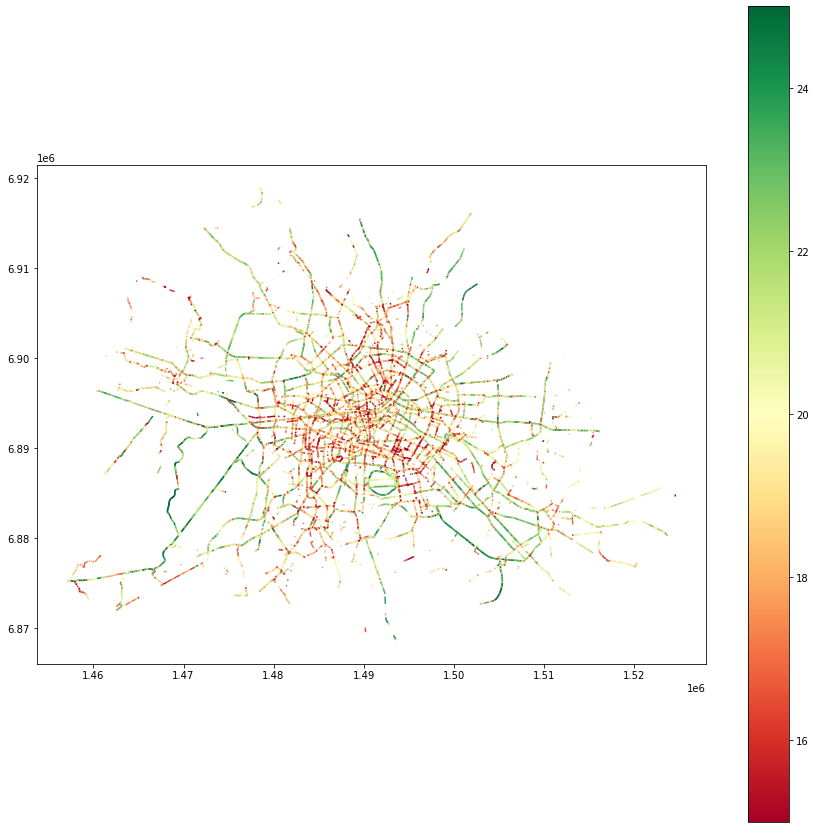

In [24]:
gdf_berlin_speed.plot(column='avg_speed_kmh', figsize=(15,15), cmap='RdYlGn', legend=True, vmax=25, vmin=15)

Text(1456988.055584678, 6854749.612579959, 'Quelle: Movebis, https://www.mcloud.de/web/guest/suche/-/results/suche/relevance/movebis/0/detail/33427A5A-0ADB-40B1-8A1A-390B67B0380B')

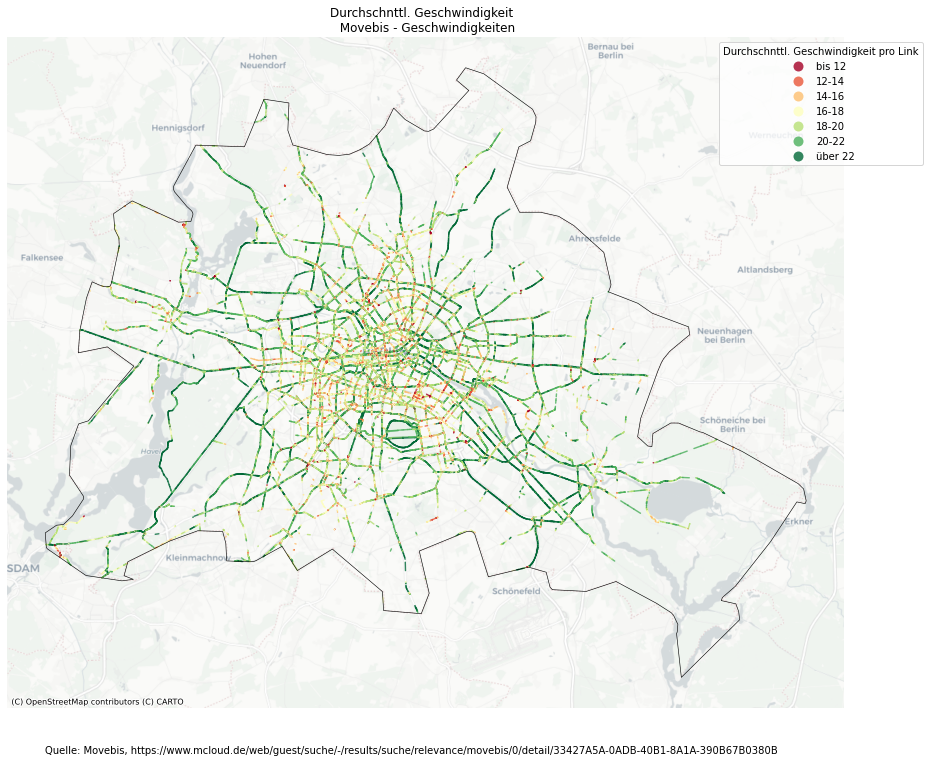

In [32]:

df_plot=gdf_berlin_speed.copy()

df_plot.geometry=df_plot.buffer(70)

#df_plot=df_plot.to_crs('EPSG:3857')


label_list=[
    'bis 12',
    '12-14',
    '14-16',
    '16-18',
    '18-20',
    '20-22',
    'über 22']


ax=df_plot.plot(column='avg_speed_kmh', scheme='UserDefined', figsize=(15,15), legend=True, alpha=0.8, cmap='RdYlGn',# linewidths=1,
            classification_kwds={
             #'k':5
             'bins':[12,14,16,18,20,22]
         },
            legend_kwds = { 
                #'numpoints':1,
                'bbox_to_anchor':(1.1, 1),
                'title': "Durchschnttl. Geschwindigkeit pro Link",#"KBA-Kategorien Elektrofzg. pro 5x5km",
                'labels':label_list }
            )
#adding bundslandgrenzen layer
fin_plot=berlin.plot(facecolor="none", edgecolor='black', linewidths=0.6, figsize=(15,15), ax=ax)#, weight=1)

#adding basemap
ctx.add_basemap(fin_plot, source=ctx.providers.CartoDB.Positron)

#remove axis
fin_plot.set_axis_off()

#add title
fin_plot.set_title('Durchschnttl. Geschwindigkeit  \n Movebis - Geschwindigkeiten')

#Quelle
fin_plot.text(df_plot.total_bounds[0], df_plot.total_bounds[1]*0.998, "Quelle: Movebis, https://www.mcloud.de/web/guest/suche/-/results/suche/relevance/movebis/0/detail/33427A5A-0ADB-40B1-8A1A-390B67B0380B")
#fin_plot.annotate("Test", xy=(0.5, 0.5))


## Hundekopf (S-Bahnring)

<AxesSubplot:>

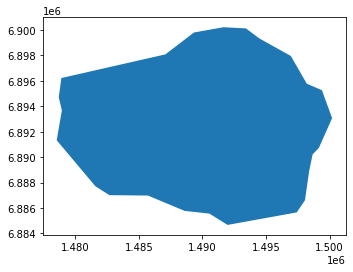

In [34]:
#hundekopf=gpd.read_file(r"hundekopf.shp")
hundekopf=gpd.read_file(r"berlin_hundekopf_polygon.geojson")

hundekopf.plot()

In [35]:
gdf_hundekopf_speed = gpd.clip(gdf_berlin_speed, hundekopf)

<AxesSubplot:>

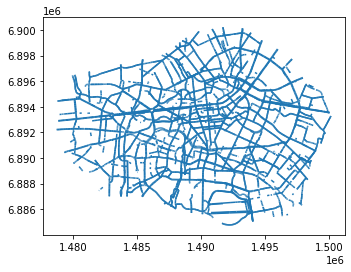

In [36]:
gdf_hundekopf_speed.plot()

Text(1478667.6377768633, 6883369.228490854, 'Quelle: Movebis, https://www.mcloud.de/web/guest/suche/-/results/suche/relevance/movebis/0/detail/33427A5A-0ADB-40B1-8A1A-390B67B0380B')

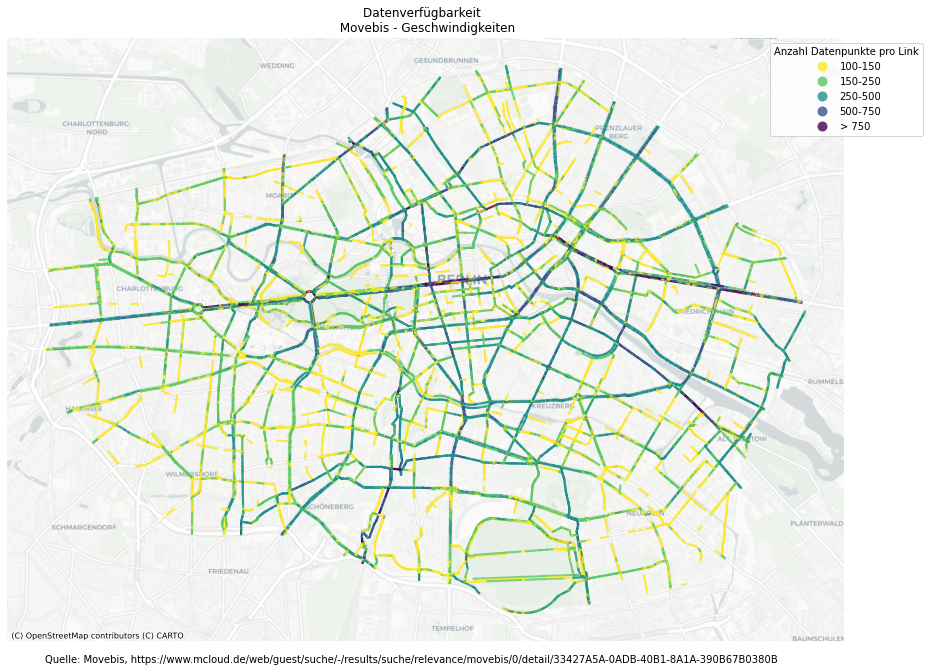

In [98]:

df_plot=gdf_hundekopf_speed.copy()

df_plot.geometry=df_plot.buffer(30)

#df_plot=df_plot.to_crs('EPSG:3857')


label_list=['100-150',
'150-250',
'250-500',
'500-750',
'> 750']


ax=df_plot.plot(column='visits', scheme='UserDefined', figsize=(15,15), legend=True, alpha=0.8, cmap='viridis_r',# linewidths=1,
            classification_kwds={
             #'k':5
             'bins':[150,250,500,750]
         },
            legend_kwds = { 
                #'numpoints':1,
                'bbox_to_anchor':(1.1, 1),
                'title': "Anzahl Datenpunkte pro Link",#"KBA-Kategorien Elektrofzg. pro 5x5km",
                'labels':label_list }
            )
#adding bundslandgrenzen layer
#fin_plot=berlin.plot(facecolor="none", edgecolor='black', linewidths=0.6, figsize=(15,15), ax=ax)#, weight=1)

#adding basemap
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)

#remove axis
ax.set_axis_off()

#add title
ax.set_title('Datenverfügbarkeit  \n Movebis - Geschwindigkeiten')

#Quelle
ax.text(df_plot.total_bounds[0], df_plot.total_bounds[1]*0.9998, "Quelle: Movebis, https://www.mcloud.de/web/guest/suche/-/results/suche/relevance/movebis/0/detail/33427A5A-0ADB-40B1-8A1A-390B67B0380B")
#fin_plot.annotate("Test", xy=(0.5, 0.5))


Text(1478667.6377768633, 6883369.228490854, 'Quelle: Movebis, https://www.mcloud.de/web/guest/suche/-/results/suche/relevance/movebis/0/detail/33427A5A-0ADB-40B1-8A1A-390B67B0380B')

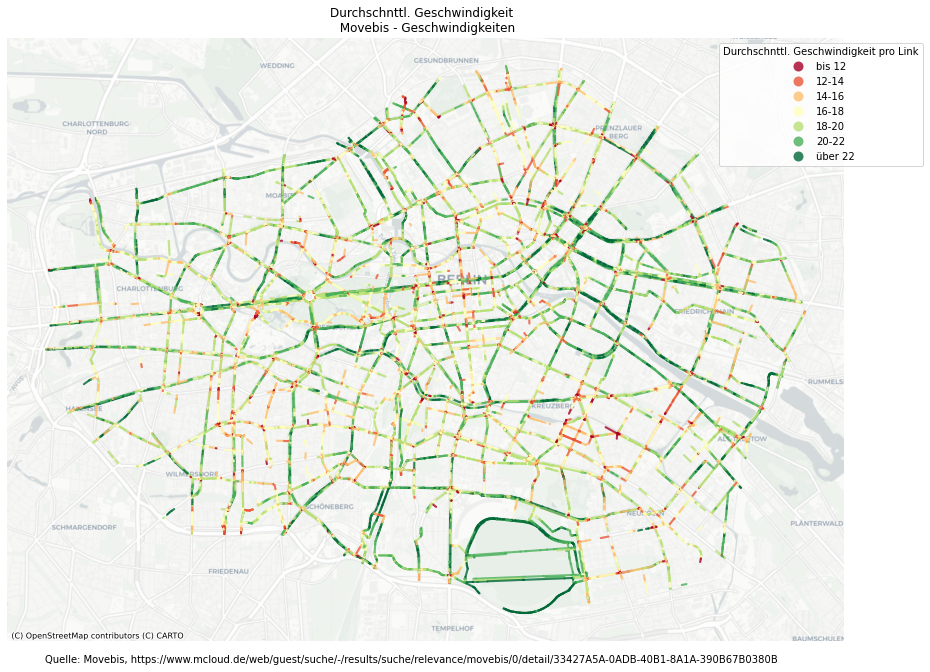

In [40]:

df_plot=gdf_hundekopf_speed.copy()

df_plot.geometry=df_plot.buffer(30)

#df_plot=df_plot.to_crs('EPSG:3857')


label_list=[
    'bis 12',
    '12-14',
    '14-16',
    '16-18',
    '18-20',
    '20-22',
    'über 22']


ax=df_plot.plot(column='avg_speed_kmh', scheme='UserDefined', figsize=(15,15), legend=True, alpha=0.8, cmap='RdYlGn',# linewidths=1,
            classification_kwds={
             #'k':5
             'bins':[12,14,16,18,20,22]
         },
            legend_kwds = { 
                #'numpoints':1,
                'bbox_to_anchor':(1.1, 1),
                'title': "Durchschnttl. Geschwindigkeit pro Link",#"KBA-Kategorien Elektrofzg. pro 5x5km",
                'labels':label_list }
            )
#adding bundslandgrenzen layer
#fin_plot=berlin.plot(facecolor="none", edgecolor='black', linewidths=0.6, figsize=(15,15), ax=ax)#, weight=1)

#adding basemap
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)

#remove axis
ax.set_axis_off()

#add title
ax.set_title('Durchschnttl. Geschwindigkeit  \n Movebis - Geschwindigkeiten')

#Quelle
ax.text(df_plot.total_bounds[0], df_plot.total_bounds[1]*0.9998, "Quelle: Movebis, https://www.mcloud.de/web/guest/suche/-/results/suche/relevance/movebis/0/detail/33427A5A-0ADB-40B1-8A1A-390B67B0380B")
#fin_plot.annotate("Test", xy=(0.5, 0.5))


In [99]:
len(gdf_berlin_speed)

53108

In [100]:
len(gdf_hundekopf_speed)

24625

In [42]:
import folium
import branca

field='avg_speed_kmh'
df=gdf_hundekopf_speed.copy()
df=df[df.visits>100].copy()
#df=gdf_berlin_speed.copy()
df[field]=df[field].round(0)


#m = folium.Map(location=[52.5, 13.35], zoom_start=13, tiles='cartodbpositron')


carto_attribution='\u0026copy; \u003ca href=\"http://www.openstreetmap.org/copyright\"\u003eOpenStreetMap\u003c/a\u003e contributors \u0026copy; \u003ca href=\"http://cartodb.com/attributions\"\u003eCartoDB\u003c/a\u003e, CartoDB \u003ca href =\"http://cartodb.com/attributions\"\u003eattributions\u003c/a\u003e' # <-- note this
custom_attribution=carto_attribution + ' | \u0026copy; \u003ca href=\"https://www.mcloud.de/web/guest/suche/-/results/suche/relevance/movebis/0/detail/33427A5A-0ADB-40B1-8A1A-390B67B0380B"\u003eMovebis\u003c/a\u003e'


m = folium.Map(location=[52.5, 13.35], 
               zoom_start=12, 
                tiles='https://cartodb-basemaps-{s}.global.ssl.fastly.net/light_all/{z}/{x}/{y}.png', 
                attr=custom_attribution)



#colorscale = branca.colormap.LinearColormap(['green','yellow','red','red','red','red'], index=None, vmin=(df[field]).min(), vmax=(df[field]).max(), caption=field)
colorscale = branca.colormap.LinearColormap(['red','orange','yellow','green','green'], index=None, vmin=12, vmax=25, caption=field)


def style_function(feature):
    col=feature['properties'][field]
    return {
        'opacity': 0.8,
        'weight': 3,
        'color': 'grey' if col is None else colorscale(col)
    }

def highlight_function(feature):

    return {
         'weight': 8,
        'color': 'grey'
    }



dummy=folium.GeoJson(
    df,
   # name='elternzeit',
    tooltip=folium.GeoJsonTooltip(fields=['avg_speed_kmh','visits']),
   style_function=style_function,
    highlight_function=highlight_function
).add_to(m)

#colorscale.caption = field
m.add_child(colorscale)

#m

### findings:
   * generelle Bewertung der Qualität möglich (insbesondere für Zielgruppe Pendler, weniger für Kinder)
   * Schutzstreifen(asphaltierte Radwege) etwa 22km/h vs. Bordradweg etwa 18km/h (dies entspricht Steigerung der v um 22%)
   * Konkret: Nord-Südverbindung duch mitte ziemlich langsam ggf. Ampelschlatungen in Wilhelm/friedichstraße attraktiver gestalten?

In [43]:
m.save('movebis_speed_hundekopf_100.html')

In [44]:
gdf_hundekopf_speed.to_file("movebis_speed_hundekopf_100.geojson", driver='GeoJSON')

In [ ]:
gdf_berlin_speed.to_file("movebis_speed_berlin_100.geojson", driver='GeoJSON')